In [5]:
import numpy as np
import networkx as nx

from helpers import import_data, Data

In [6]:
data = import_data("gdb1.txt")

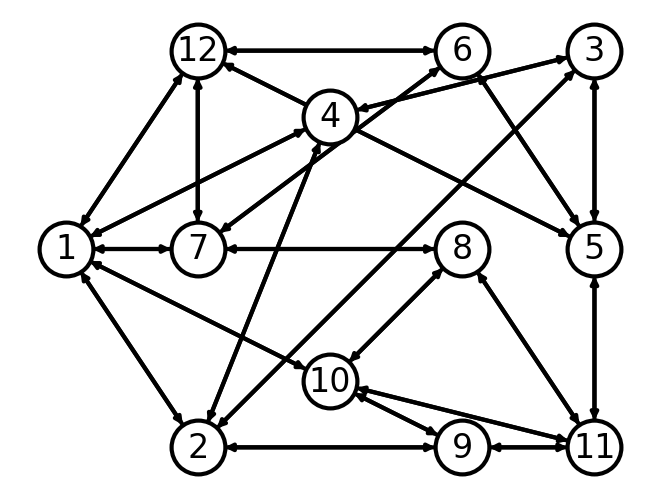

In [8]:
def plot_graph(G: nx.DiGraph, path: list | None = None):
    options = {
        "font_size": 24,
        "node_size": 1500,
        "node_color": "white",
        "edgecolors": "black",
        "linewidths": 3,
        "width": 3,
        "with_labels": True,
    }

    layers = {
        0: [1],
        1: [2, 7, 12],
        2: [10, 4],
        3: [9, 8, 6],
        4: [11, 5, 3],
    }

    pos = {}
    width = 1.0 / (len(layers) - 1)
    for i, (layer, nodes) in enumerate(layers.items()):
        height = 1.0 / (len(nodes) + 1)
        for j, node in enumerate(nodes):
            pos[node] = (i * width, (j + 1) * height)

    nx.draw(G, pos, **options)

    if path is not None:
        path_edges = list(zip(path, path[1:]))
        nx.draw_networkx_edges(G, pos, edgelist=path_edges, edge_color="r", width=5)
        nx.draw_networkx_nodes(G, pos, nodelist=path, node_color="lightblue", node_size=2000)


plot_graph(data.graph)

## Solution


In [25]:
class RubbishCollectionACO:
    def __init__(self, data: Data, alpha=1.0, beta=1.0, evaporation_rate=0.5, iterations=100):
        """
        Initializes the ACO model for rubbish collection.
        :param graph: A NetworkX graph where nodes represent junctions and edges represent streets.
                       Edges must have 'cost', 'demand', and 'frequency' attributes.
        :param n_vehicles: Number of vehicles available for rubbish collection.
        :param alpha: Pheromone importance coefficient.
        :param beta: Cost (desirability) importance coefficient.
        :param evaporation_rate: Rate at which pheromone evaporates.
        :param iterations: Number of iterations to run the simulation.
        """
        self.graph = data.graph
        self.n_vehicles = data.nb_trucks
        self.alpha = alpha
        self.beta = beta
        self.evaporation_rate = evaporation_rate
        self.iterations = iterations
        self.pheromone = {edge: 1.0 for edge in self.graph.edges}  # Initial pheromone level

    def update_pheromone(self, all_paths, costs):
        """
        Updates pheromone levels based on the paths taken by all ants in an iteration.
        :param all_paths: A list of paths taken by all ants.
        :param costs: A list of total costs for each path.
        """
        # Evaporate pheromone
        for edge in self.pheromone:
            self.pheromone[(edge[0], edge[1])] *= 1 - self.evaporation_rate

        # Add pheromone
        for path, cost in zip(all_paths, costs):
            for edge in path:
                # Increase pheromone based on the efficiency of the path
                self.pheromone[(edge[0], edge[1])] += 1 / cost

    def choose_next_edge(self, current_node, visited_edges):
        """
        Chooses the next edge for an ant to follow based on pheromone levels and edge desirability.
        :param current_node: The current node the ant is at.
        :param visited_edges: Edges already visited by the ant.
        :return: The next edge to follow.
        """
        edges = list(self.graph.edges(current_node, data=True))
        probabilities = []
        for edge in edges:
            if (edge[0], edge[1]) not in visited_edges:
                pheromone_level = self.pheromone[(edge[0], edge[1])]
                desirability = 1 / edge[2]["cost_traversing"]  # Assuming cost is always > 0
                probability = (pheromone_level**self.alpha) * (desirability**self.beta)
                probabilities.append(probability)
            else:
                probabilities.append(0)

        probabilities = np.array(probabilities) / np.sum(probabilities)
        if np.isnan(probabilities).any():
            probabilities = np.ones(len(edges)) / np.sum(len(edges))

        print(edges, probabilities)

        edge_idx = list(range(len(edges)))
        idx = np.random.choice(edge_idx, p=probabilities)
        return edges[idx]

    def find_path(self):
        """
        Finds a path for a single ant based on current pheromone levels.
        :return: The path and total cost.
        """
        path = []
        total_cost = 0
        current_node = 1  # Starting at the depot node
        visited_edges = set()

        while len(visited_edges) < len(self.graph.edges):
            next_edge = self.choose_next_edge(current_node, visited_edges)
            if next_edge:
                path.append(next_edge)
                visited_edges.add((next_edge[0], next_edge[1]))
                total_cost += next_edge[2]["cost_traversing"]
                # Move to the next node
                current_node = next_edge[1]
            else:
                # If no unvisited edges, break the loop
                break

        return path, total_cost

    def run(self):
        """
        Runs the ACO algorithm for a set number of iterations to find the optimal routes for rubbish collection.
        """
        best_cost = float("inf")
        best_paths = None

        for iteration in range(self.iterations):
            all_paths = []
            costs = []

            for _ in range(self.n_vehicles):
                path, cost = self.find_path()
                all_paths.append(path)
                costs.append(cost)

            # Update pheromone levels based on the paths of all ants
            self.update_pheromone(all_paths, costs)

            # Check if we found a better solution
            iteration_best_cost = min(costs)
            if iteration_best_cost < best_cost:
                best_cost = iteration_best_cost
                best_paths = all_paths[costs.index(best_cost)]

            print(f"Iteration {iteration+1}, Best Cost: {best_cost}")

        return best_paths, best_cost

In [26]:
# Initialize and run the ACO model
aco_model = RubbishCollectionACO(data)
best_paths, best_cost = aco_model.run()

print(f"Best Paths: {best_paths}\nBest Cost: {best_cost}")

[(1, 2, {'arc': 2, 'demand': 1, 'cost_traversing': 13, 'cost_collecting': 13, 'opposed_arc': 7, 'successor_arcs': [7, 8, 9, 10], 'frequency': 4}), (1, 4, {'arc': 3, 'demand': 1, 'cost_traversing': 17, 'cost_collecting': 17, 'opposed_arc': 14, 'successor_arcs': [14, 15, 16], 'frequency': 1}), (1, 7, {'arc': 4, 'demand': 1, 'cost_traversing': 19, 'cost_collecting': 19, 'opposed_arc': 24, 'successor_arcs': [24, 25, 26, 27], 'frequency': 4}), (1, 10, {'arc': 5, 'demand': 1, 'cost_traversing': 19, 'cost_collecting': 19, 'opposed_arc': 34, 'successor_arcs': [34, 35, 36, 37], 'frequency': 2}), (1, 12, {'arc': 6, 'demand': 1, 'cost_traversing': 4, 'cost_collecting': 4, 'opposed_arc': 42, 'successor_arcs': [42, 43, 44, 45], 'frequency': 4})] [0.15666303 0.11980114 0.10719049 0.10719049 0.50915484]
[(10, 1, {'arc': 34, 'demand': 1, 'cost_traversing': 19, 'cost_collecting': 19, 'opposed_arc': 5, 'successor_arcs': [1, 2, 3, 4, 5, 6], 'frequency': 2}), (10, 8, {'arc': 35, 'demand': 1, 'cost_travers

/var/folders/ny/x91f_3hj6h90yj4gjh88c0tm0000gn/T/ipykernel_44882/3752455433.py:55: RuntimeWarning: invalid value encountered in divide
  probabilities = np.array(probabilities) / np.sum(probabilities)
